<a href="https://colab.research.google.com/github/hugovr24/Track/blob/main/Behavioral_Cloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/hugovr24/Track

Cloning into 'Track'...
remote: Enumerating objects: 28282, done.
remote: Total 28282 (delta 0), reused 0 (delta 0), pack-reused 28282
Receiving objects: 100% (28282/28282), 356.28 MiB | 36.60 MiB/s, done.
Updating files: 100% (28279/28279), done.


In [ ]:
!ls track

driving_log.csv  IMG


In [ ]:
!pip3 install imgaug

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
datadir = 'Track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\center_2024_06_05_15_51_19_140.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\left_2024_06_05_15_51_19_140.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\right_2024_06_05_15_51_19_140.jpg,0.0,0.0,0.0,0.000078
1,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\center_2024_06_05_15_51_19_241.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\left_2024_06_05_15_51_19_241.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\right_2024_06_05_15_51_19_241.jpg,0.0,0.0,0.0,0.000078
2,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\center_2024_06_05_15_51_19_341.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\left_2024_06_05_15_51_19_341.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\right_2024_06_05_15_51_19_341.jpg,0.0,0.0,0.0,0.000078
3,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\center_2024_06_05_15_51_19_441.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\left_2024_06_05_15_51_19_441.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\right_2024_06_05_15_51_19_441.jpg,0.0,0.0,0.0,0.000079
4,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\center_2024_06_05_15_51_19_542.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\left_2024_06_05_15_51_19_542.jpg,C:\Users\hugo\OneDrive\Documents\ALL Engineering\Autonomous Cars\Autonomous car\Data\IMG\right_2024_06_05_15_51_19_542.jpg,0.0,0.0,0.0,0.000078


In [ ]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

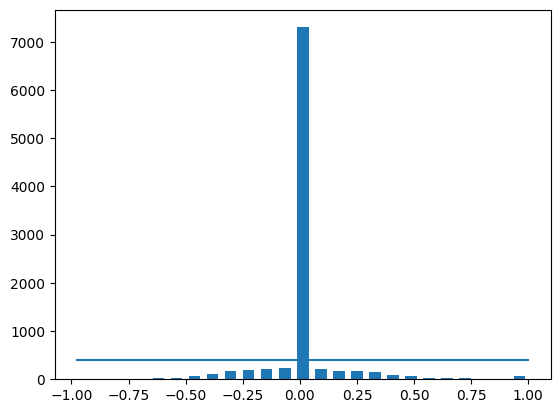

In [ ]:
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 9426
removed: 6901
remaining: 2525


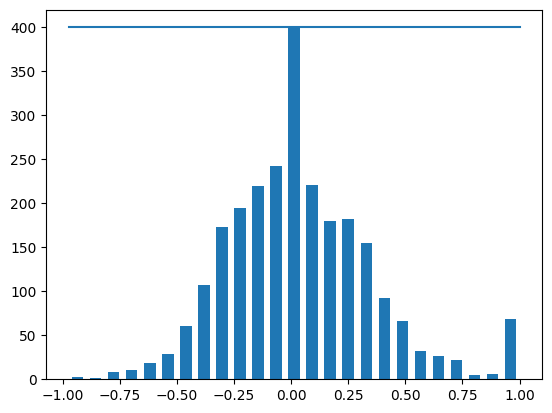

In [ ]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2024_06_05_15_51_21_452.jpg
left          left_2024_06_05_15_51_21_452.jpg
right        right_2024_06_05_15_51_21_452.jpg
steering                                   0.0
throttle                              0.596673
reverse                                    0.0
speed                                  0.75928
Name: 23, dtype: object


In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 6060
Valid Samples: 1515


Text(0.5, 1.0, 'Validation set')

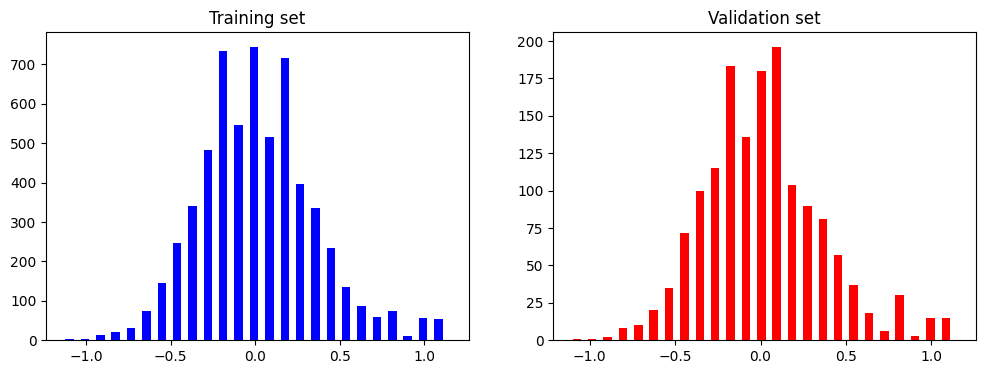

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

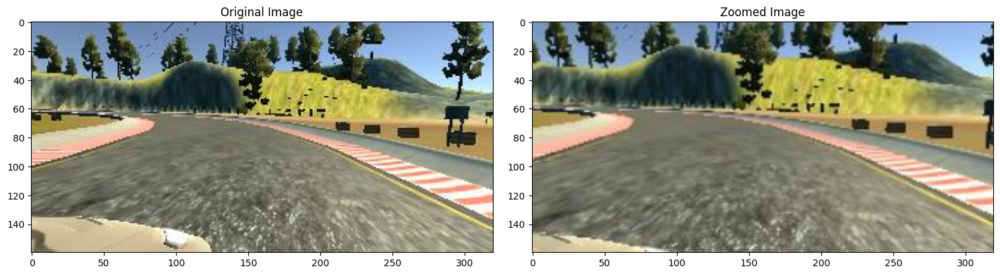

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

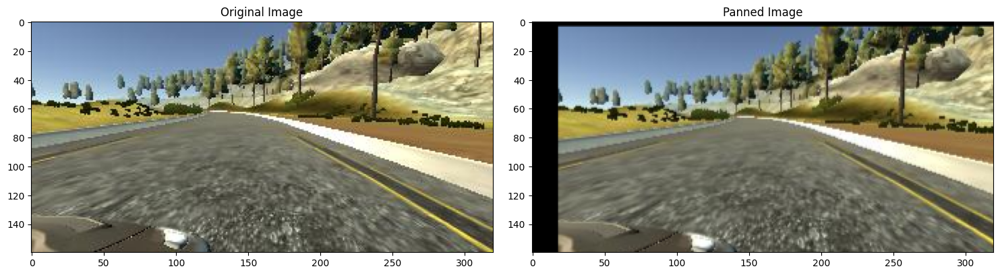

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Brightness altered image ')

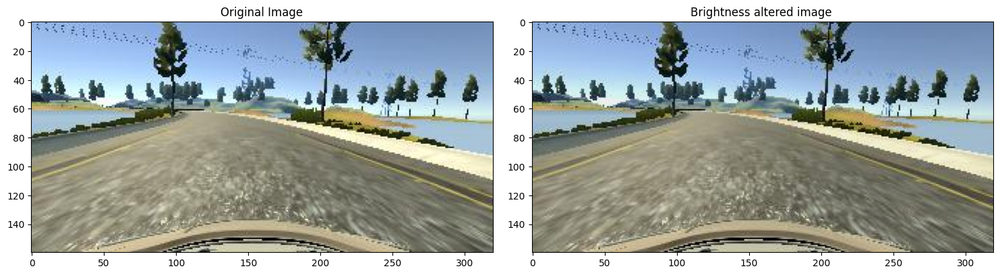

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.1637183')

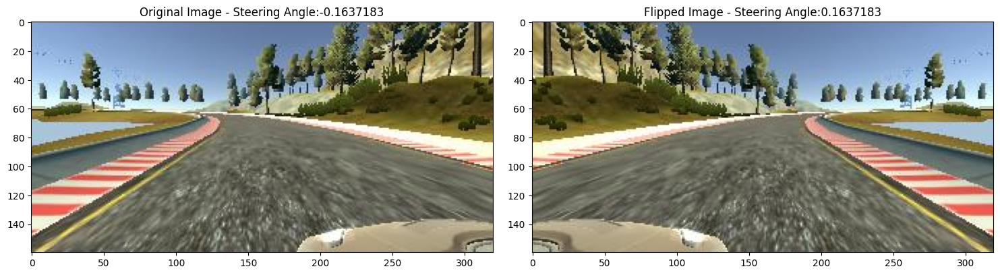

In [ ]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

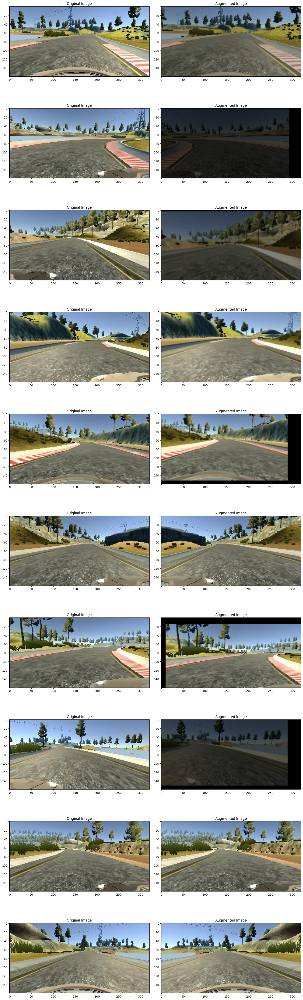

In [ ]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

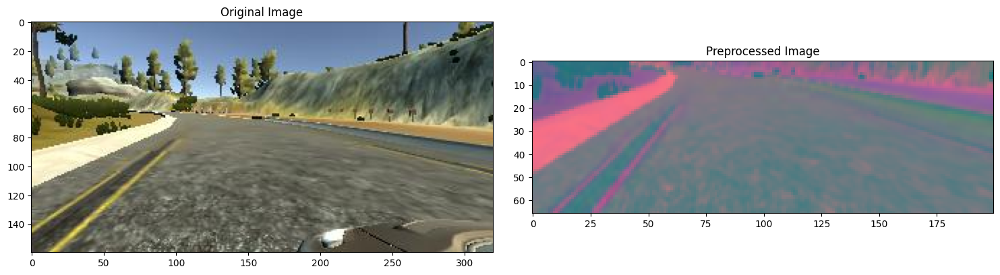

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

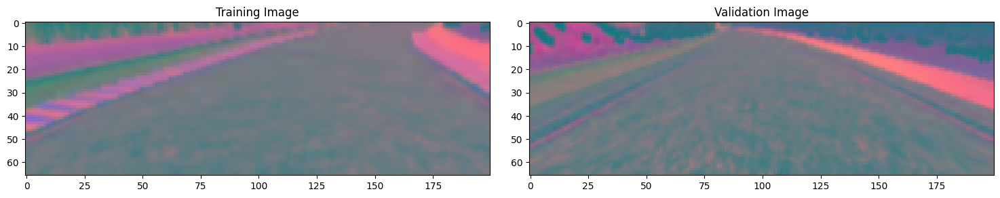

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
# define NVIDIA model for selfdriving car - effective for behavioral cloning and good for real live self driven cars

def nvidia_model():

  model = Sequential()

  model.add(Convolution2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))

  model.add(Convolution2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Convolution2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))

  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Flatten())

  model.add(Dense(100, activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(50, activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(10, activation ='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer= Adam(lr=1e-4)
  model.compile(loss='mse', optimizer=optimizer)

  return model

In [ ]:
model = nvidia_model()
print(model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_26 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_27 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_28 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_29 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_5 (Flatten)         (None, 1152)              0         
                                                                 
 dense_20 (Dense)            (None, 100)              

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-62-1380e7fdc075>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 124s 405ms/step - loss: 0.1613 - val_loss: 0.0858
Epoch 2/10
300/300 [==============================] - 123s 412ms/step - loss: 0.0960 - val_loss: 0.0826
Epoch 3/10
300/300 [==============================] - 121s 403ms/step - loss: 0.0821 - val_loss: 0.0700
Epoch 4/10
300/300 [==============================] - 121s 404ms/step - loss: 0.0761 - val_loss: 0.0680
Epoch 5/10
300/300 [==============================] - 128s 429ms/step - loss: 0.0667 - val_loss: 0.0562
Epoch 6/10
300/300 [==============================] - 118s 395ms/step - loss: 0.0612 - val_loss: 0.0565
Epoch 7/10
300/300 [==============================] - 118s 396ms/step - loss: 0.0584 - val_loss: 0.0510
Epoch 8/10
300/300 [==============================] - 128s 428ms/step - loss: 0.0540 - val_loss: 0.0433
Epoch 9/10
300/300 [==============================] - 113s 379ms/step - loss: 0.0536 - val_loss: 0.0419
Epoch 10/10
300/300 [==============================] - 112s 375m

Text(0.5, 0, 'Epoch')

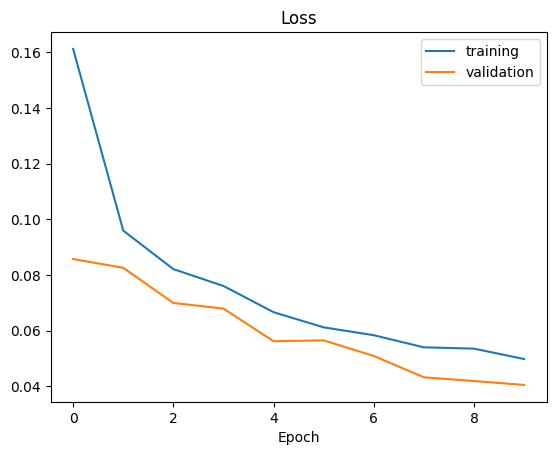

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>